In [63]:
using Plots, Polynomials, LinearAlgebra
include("../../datatools.jl");

In [64]:
sweetwater_base = get_folder_dataframes("Sweetwater");
sb = copy(sweetwater_base)

folders = ["Gale/East", "Gale/West", "Museum", "Sweetwater"]

all_dfs = Dict()

for f in folders
     all_dfs[f] = get_folder_dataframes(f)
end



In [65]:
plots = []

for street in keys(all_dfs)
     p = plot(title=street, legend=:none, xticks=:none)
     for df in all_dfs[street]
          scatter!(df.latitude, df.altitude)
     end
     push!(plots, p)
end

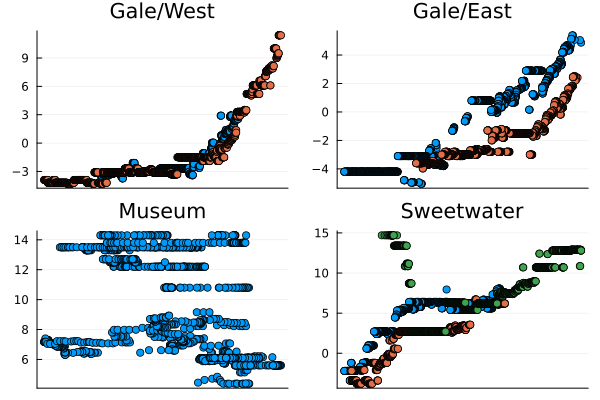

In [66]:
plot(plots...)

In [67]:
function sigmoid(x, a, b)
     res = @. 1.0 / (1.0 + exp(-a * (x-b)))
     return res
end

sigmoid (generic function with 1 method)

In [94]:
function expo(xs, a, b)
     return  @. a * exp.(b * xs)
end

expo (generic function with 1 method)

In [68]:
using Optim

In [69]:
function fit_model_to_data(train_xs, train_ys, model_func, initial_params)
     
     function loss(params)
          predicted_y = model_func(xs, params...)
          return sum((ys - predicted_y) .^ 2)
     end

     opt_res = optimize(loss, initial_params)
     # @show opt_res
     opt_params = Optim.minimizer(opt_res)

     # @show opt_params
     fitted_ys = model_func(xs, opt_params...)

     return fitted_ys
end

fit_model_to_data (generic function with 1 method)

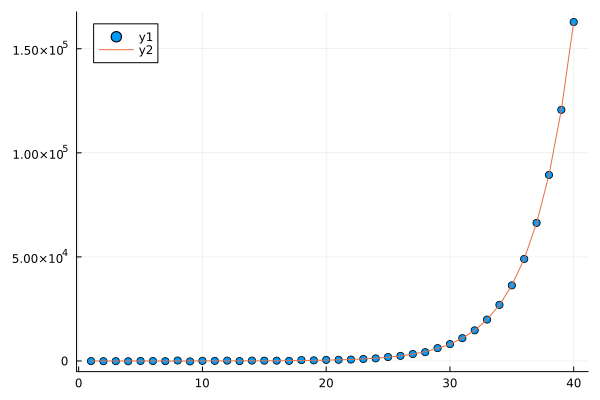

In [104]:
test_x = collect(1:40) 
test_y = exp.(0.3 .* test_x) .- 5 + (randn(length(test_x)) * 100)

ys = fit_model_to_data(test_x, test_y, expo, [1.0, 1.0])

scatter(test_x, test_y)
plot!(test_x, ys)

In [70]:
gwdf = stack_df_vectors(all_dfs["Gale/West"]);

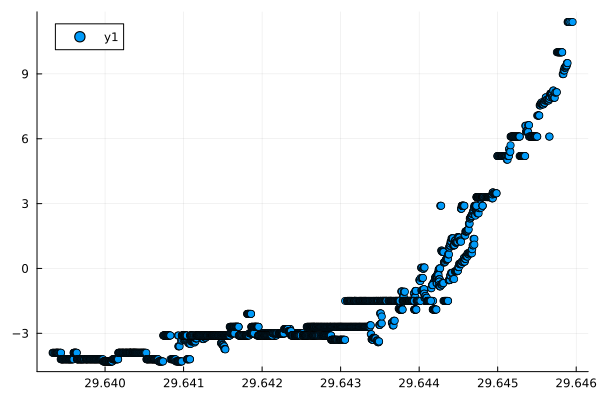

In [71]:
scatter(gwdf.latitude, gwdf.altitude)

expo (generic function with 1 method)

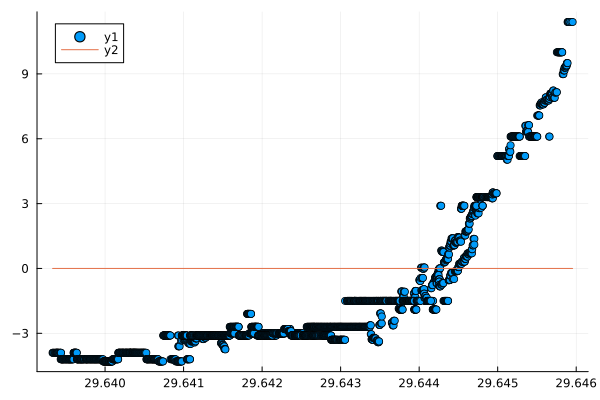

In [73]:
fit_ys = fit_model_to_data(gwdf.latitude, gwdf.altitude, expo, [2.0, 1.4]);

scatter(gwdf.latitude, gwdf.altitude)
plot!(gwdf.latitude, fit_ys)

In [74]:
test_x = collect(1:20) 
test_y = exp.(0.3 .* test_x) .- 5.0 + (randn(length(test_x)) * 5)

20-element Vector{Float64}:
  -1.495873476500952
  -7.749234843948641
  -9.717257530710757
   8.077007562966024
  -0.39819011257581577
   0.43760423748861677
  -0.982279398168294
   0.12188305751011086
   8.616190123300612
  18.651145951501654
  20.81572261992312
  37.41117121472657
  38.91575622528778
  61.861848024982606
  92.65693520740517
 114.50805788172109
 171.80616006665267
 214.47989019399338
 298.34751406343446
 404.48097269264514

In [75]:
scatter(test_x, test_y)
fit_test = fit_model_to_data(test_x, test_y, expo, [1.0, 1.0, 1.0])
plot!(test_x, fit_test)

MethodError: MethodError: no method matching expo(::Vector{Int64}, ::Float64, ::Float64, ::Float64)

Closest candidates are:
  expo(::Any, ::Any, ::Any)
   @ Main ~/Documents/Spring2024/NumericalAnalysis/NA-FinalProject/src/simple_fits_1d/simple.ipynb:1


In [76]:
function gompertz(x, a, b, c, d)
     e = exp(1)
     return @. (a * e^(b*e^(-c*x)) + d)
end


gompertz (generic function with 1 method)

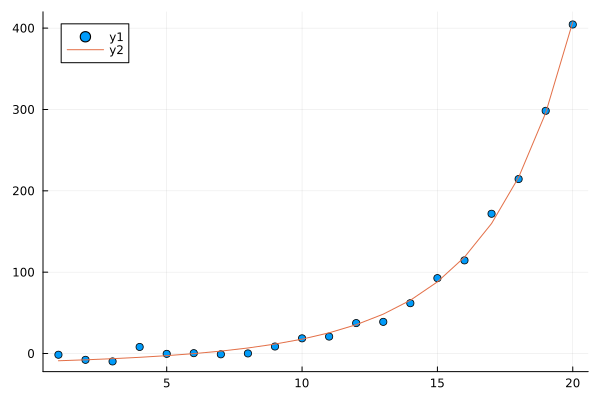

In [77]:
y2 = fit_model_to_data(test_x, test_y, gompertz, [0.0, 0.0, 0.0, 0.0])

scatter(test_x, test_y)
plot!(test_x, y2)

In [78]:
xs = gwdf.latitude;
ys = gwdf.altitude;

fity = fit_model_to_data(xs, ys, sigmoid, [12.0, 1.0])


2762-element Vector{Float64}:
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 ⋮
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0
 1.0

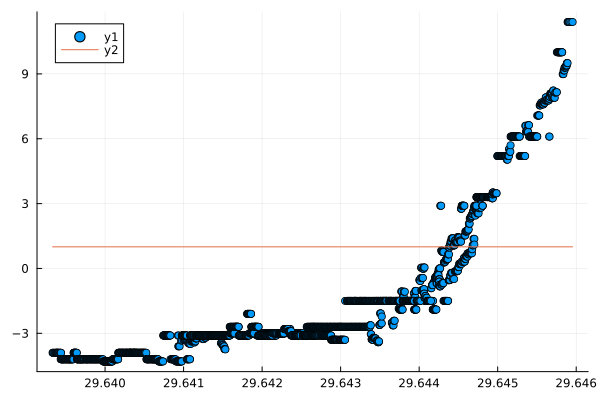

In [79]:

scatter(xs, ys)
plot!(xs, fity)

In [80]:
function line(x, a, b)
     return @. a*x + b
end

line (generic function with 1 method)

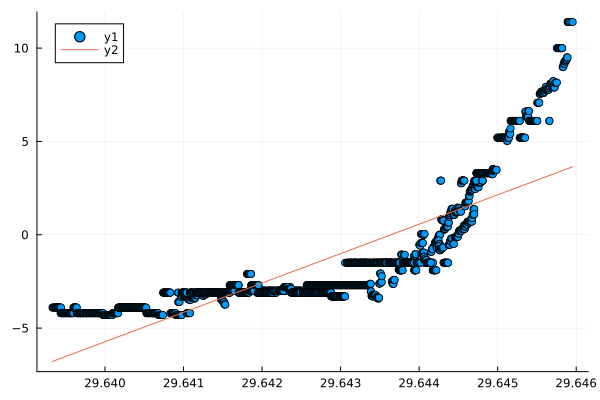

In [81]:
fity = fit_model_to_data(xs, ys, line, [10.0, -3.0])

scatter(xs, ys)
plot!(xs, fity)

Stuff from 3.1.5

[0.9548142874554257]
[0.13194132115192966, 0.9007056741304044]
[-0.07919193025348079, 2.303569435005123, -1.2196943509296094]
[-0.10558721399697477, 2.852822670751954, -2.5293081946317786, 0.7917238816141688]
[norm(r.r) for r = results] = [1.2951421737885032, 0.4957179947596437, 0.30142712885359935, 0.29434943800244534]


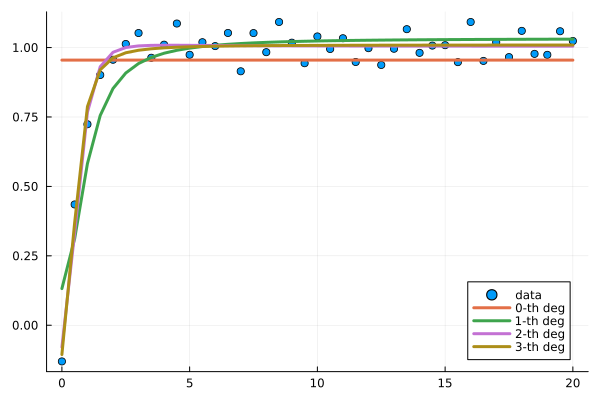

In [82]:
t = 0:0.5:20
y = tanh.(t)   + randn(length(t))/20          # apply the true model to get data
z̄(t) = t^2/(t^2 +1)
z = z̄.(t)               # apply the coordinate transform 
M = @. [z^0 z z^2 z^3]  # create the design matrix
results = []
plt = scatter(t, y, label="data")

t̄ = t
for i in 1:size(M, 2)
    A = M[:, 1:i]
    x̂ = A \ y
    r = y - A*x̂
    push!(results, (x = x̂, r = r))
    println(x̂)
    plot!(t̄, Polynomial(x̂).(z̄.(t̄)), label="$(i-1)-th deg", lw=3)
end
@show [norm(r.r) for r in results]
plt

In [83]:
function fit_exotic(model_func, xs, ys, x_test)
     z = model_func.(xs)

     M = @. [z^0 z z^2 z^3 z^4]  

     results = []
     residuals = []

     for i = 1:size(M, 2)
          A = M[:, 1:i]
          x̄ = A \ ys
          r = ys - A*x̄
          res = Polynomial(x̄).(model_func.(x_test))

          push!(results, res)
          push!(residuals, r)
     end

     return results, residuals

end


fit_exotic (generic function with 1 method)

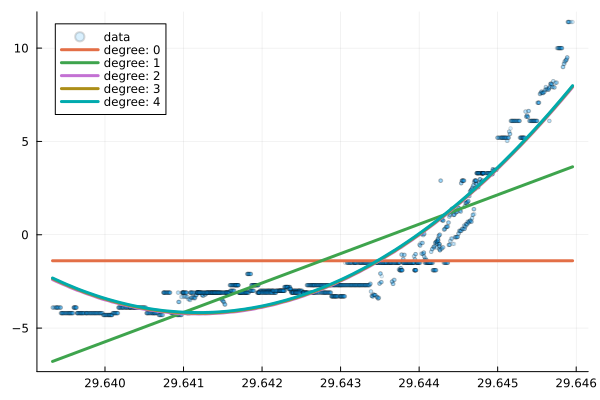

In [84]:
mf = x-> x^2/(x^2 + 1)

x_test = collect(range(minimum(xs), maximum(xs), length=150))

rts, rds = fit_exotic(mf, xs, ys, x_test)

rts
# mr = [r.r for r in results];
plt = scatter(xs, ys, markeralpha=0.15, ms=2, label="data")

for i = 1:length(rts)
     plot!(plt, x_test, rts[i], lw=3, label="degree: $(i-1)")
end

plt

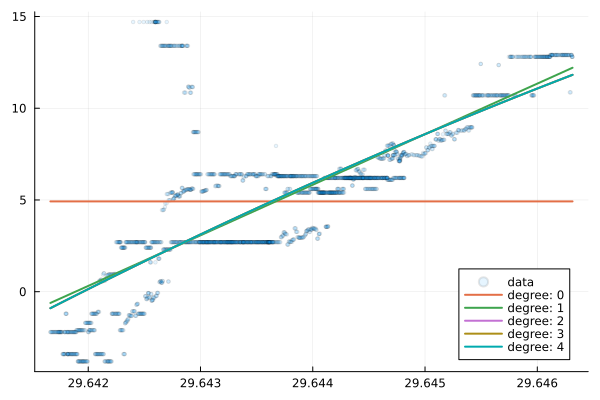

In [85]:
swdf = stack_df_vectors(all_dfs["Sweetwater"]);

swx = swdf.latitude;
swy = swdf.altitude;

x_test = collect(range(minimum(swx), maximum(swx), 150));

mf = x-> log(x)
# mf = x-> x^2/(x^2 + 1)

res , rs = fit_exotic(mf, swx, swy, x_test);

plt = scatter(swx, swy, markeralpha=0.1, ms=2, label="data")

for i = 1:length(res)
     plot!(plt, x_test, res[i], lw=2, label="degree: $(i-1)")
end

plt

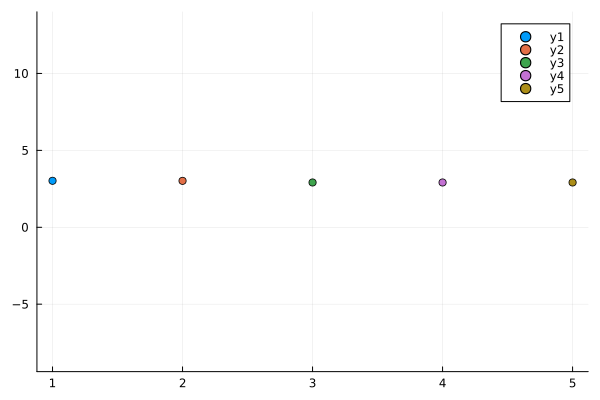

In [86]:
plt = plot()
for i = 1:length(rs)
     scatter!(plt, [i], [rs[i]]) 
end
plt

In [105]:
function ridge_regression_prediction(x_data, y_data, test_x, model_func, λ)

     # apply logistical transf.
     xs = model_func.(x_data)
     
     # result of applying funciton to data
     # design matrix
     X = @. [xs^0 xs^1 xs^2 xs^3]

     # regularization matrix
     L = λ * I(size(X, 2))

     # ridge regression
     β = inv(X' * X + L) * X' * y_data

     # evaluate new data
     test_xs = model_func.(test_x)
     
     Xt = @. [test_xs^0 test_xs^1 test_xs^2 test_xs^3]
     
     y_pred = Xt * β

     return y_pred

end

ridge_regression_prediction (generic function with 1 method)

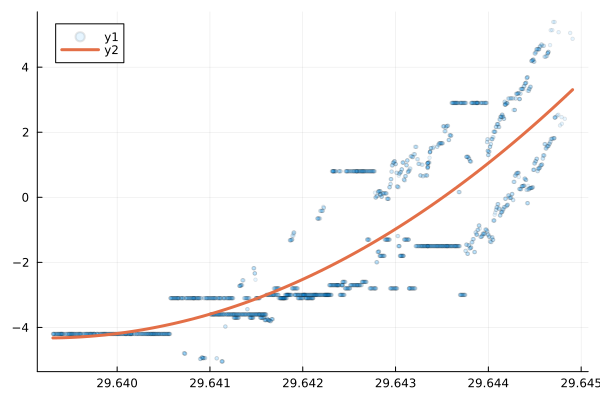

In [88]:
gedf = stack_df_vectors(all_dfs["Gale/East"]);
gex = gedf.latitude;
gey = gedf.altitude;

test_gex = collect(range(minimum(gex), maximum(gex), 100));

# trying exponential function
model_func = x-> exp(x)

test_gey = ridge_regression_prediction(gex, gey, test_gex, model_func, 1.0)

scatter(gex, gey, ms=2, ma = 0.1)
plot!(test_gex, test_gey, lw = 3)

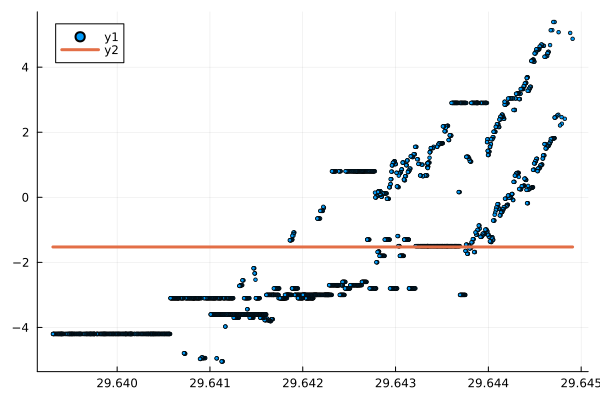

In [89]:
# trying sigmoid
model_func2 = x-> (1/(1+exp(-x)))
test_gey2 = ridge_regression_prediction(gex, gey, test_gex, model_func2, 1.0)

scatter(gex, gey, ms=2)
plot!(test_gex, test_gey2, lw = 3)

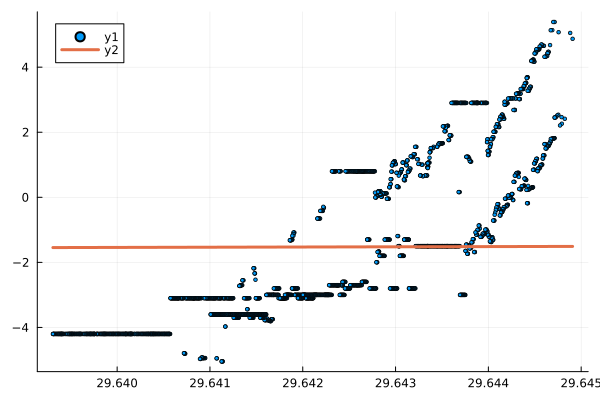

In [90]:
model_func3 = x-> sin(x)
test_gey3 = ridge_regression_prediction(gex, gey, test_gex, model_func3, 0.2)

scatter(gex, gey, ms=2)
plot!(test_gex, test_gey3, lw = 3)

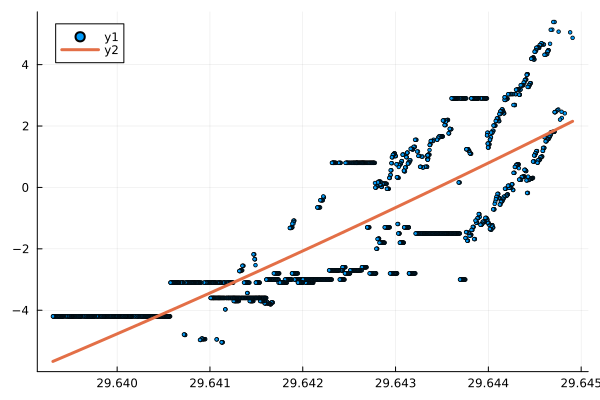

In [91]:
model_func4 = x-> tan(x)
test_gey4 = ridge_regression_prediction(gex, gey, test_gex, model_func4, 0.2)

scatter(gex, gey, ms=2)
plot!(test_gex, test_gey4, lw = 3)